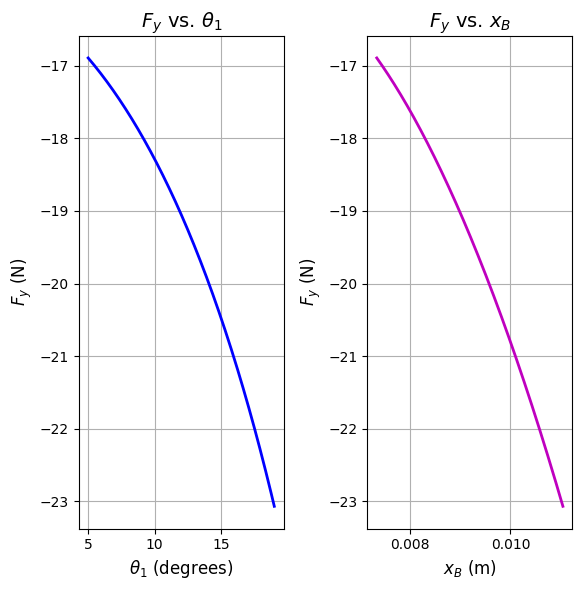

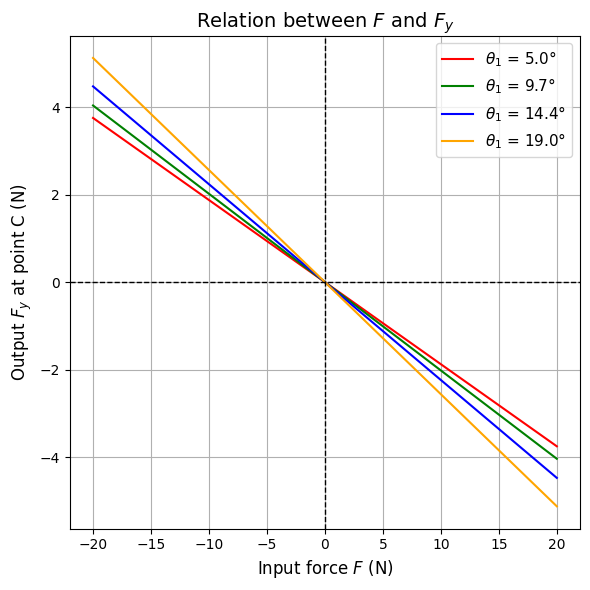

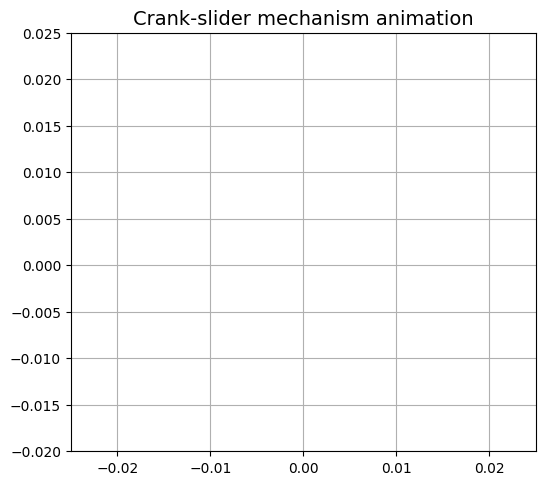

In [20]:
# 导入必要的库
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import FancyArrowPatch
from IPython.display import HTML

# =====================================
# 1. 参数设定
# =====================================
# L1 = 1.5               # OA 长度
# L2 = 1.0               # AB 长度（注意：保证 L2^2 - (L1*sinθ1 + h)^2 非负）
# L3 = 0.7               # AC 长度
# theta3 = -60 / 180 * np.pi  # 固定角 OAC，单位：弧度
# h = 0.5                # 滑块所在水平轨道的 y 坐标为 -h，即 y = -0.5
# F = 10.0               # 施加在滑块 B 上的水平力

# 单位 m
L1 = 45e-3               # OA 长度
L2 = 40e-3               # AB 长度（注意：保证 L2^2 - (L1*sinθ1 + h)^2 非负）
L3 = 40e-3               # AC 长度
theta3 = -60 / 180 * np.pi  # 固定角 OAC，单位：弧度
h = 10e-3                 # 滑块所在水平轨道的 y 坐标为 -h，即 y = -0.5
F = 90.0               # 施加在滑块 B 上的水平力

# =====================================
# 2. 预计算 theta1 范围及各关键点位置
# =====================================
# 为确保根号内非负，可以适当限定 θ1 的范围（单位：度），这里取 10° 到 60°
theta1_deg = np.linspace(5, 19, 300)
theta1 = np.radians(theta1_deg)

# --- 点 A 的坐标 ---
# A 为 OA 末端，A = (L1*cosθ1, L1*sinθ1)
Ax = L1 * np.cos(theta1)
Ay = L1 * np.sin(theta1)

# --- 滑块 B 的坐标 ---
# 由于 B 位于 y = -h 的水平轨道上，设 B = (x_B, -h)
# 根据连杆 AB 长度，满足：
#   (x_B - Ax)^2 + (-h - Ay)^2 = L2^2
# 解得（选取 "-"号，表示 B 在 A 的左侧）
#   x_B = Ax - sqrt( L2^2 - (Ay + h)^2 )
discriminant = L2**2 - (Ay + h)**2
# 为防止数值误差，将负值 clip 至 0
discriminant = np.clip(discriminant, 0, None)
xB = Ax - np.sqrt(discriminant)
yB = -h * np.ones_like(xB)

# --- 点 C 的坐标 ---
# 连杆 AC 从 A 出发，固定与 OA 保持角 theta3
Cx = Ax + L3 * np.cos(theta1 + theta3)
Cy = Ay + L3 * np.sin(theta1 + theta3)

# --- 计算 dx_B/dθ1 与 dy_C/dθ1 ---
# 数值微分（以 theta1 为自变量）
dtheta = theta1[1] - theta1[0]

# 直接计算 dx_B/dtheta1 的解析表达式：
# dx_B/dθ1 = -L1*sinθ1 + [ L1*cosθ1*(L1*sinθ1 + h) ] / sqrt( L2^2 - (L1*sinθ1 + h)^2 )
# 为保持数组运算，用 discriminant 的平方根
sqrt_term = np.sqrt(discriminant)
dxB_dtheta = -L1 * np.sin(theta1) + (L1 * np.cos(theta1) * (L1 * np.sin(theta1) + h)) / (sqrt_term + 1e-6)

# 计算 dy_C/dθ1（解析求导）
# y_C = L1*sinθ1 + L3*sin(θ1+θ3) => dy_C/dθ1 = L1*cosθ1 + L3*cos(θ1+θ3)
dyC_dtheta = L1 * np.cos(theta1) + L3 * np.cos(theta1 + theta3)

# 根据虚功原理：F_y = F*(dx_B/dθ1)/(dy_C/dθ1)
# 为防止除 0，引入一个小量 epsilon
epsilon = 1e-6
Fy = -F * dxB_dtheta / (dyC_dtheta + epsilon)

# =====================================
# 3. 并排绘制两张静态图像：Fy-θ1 与 Fy-xB
# =====================================
fig, axes = plt.subplots(1, 2, figsize=(6, 6))

# --- 第1张图：Fy vs theta1 ---
axes[0].plot(theta1_deg, Fy, 'b-', linewidth=2)
axes[0].set_xlabel(r'$\theta_1$ (degrees)', fontsize=12)
axes[0].set_ylabel(r'$F_y$ (N)', fontsize=12)
axes[0].set_title(r'$F_y$ vs. $\theta_1$', fontsize=14)
axes[0].grid(True)

# --- 第2张图：Fy vs xB ---
axes[1].plot(xB, Fy, 'm-', linewidth=2)
axes[1].set_xlabel(r'$x_B$ (m)', fontsize=12)
axes[1].set_ylabel(r'$F_y$ (N)', fontsize=12)
axes[1].set_title(r'$F_y$ vs. $x_B$', fontsize=14)
axes[1].grid(True)

plt.tight_layout()
plt.show()

# =====================================
# 4. 绘制 Fy 关于 F 的变化关系图（选取某些角度作为样例）
# =====================================

# 选取几个关键的 theta1 索引，比如起点、中间、终点
idx_list = [0, len(theta1)//3, 2*len(theta1)//3, -1]
colors = ['r', 'g', 'b', 'orange']

# 准备不同的 F 值进行扫描（比如从 -20 到 20N）
F_test = np.linspace(-20, 20, 200)

plt.figure(figsize=(6,6))

for idx, color in zip(idx_list, colors):
    K = dxB_dtheta[idx] / (dyC_dtheta[idx] + epsilon)  # Fy = -F*K
    Fy_test = -F_test * K
    plt.plot(F_test, Fy_test, color=color, label=fr'$\theta_1$ = {theta1_deg[idx]:.1f}°')

plt.axhline(0, color='k', linestyle='--', linewidth=1)
plt.axvline(0, color='k', linestyle='--', linewidth=1)
plt.xlabel(r'Input force $F$ (N)', fontsize=12)
plt.ylabel(r'Output $F_y$ at point C (N)', fontsize=12)
plt.title(r'Relation between $F$ and $F_y$', fontsize=14)
plt.legend(fontsize=11)
plt.grid(True)
plt.tight_layout()
plt.show()


# =====================================
# 5. 动画展示机构运动过程
# =====================================
# 动画中同时展示连杆 OA、AB、AC，以及力箭头（F 横向施加在 B 处，F_y 在 C 点显示）
fig, ax = plt.subplots(figsize=(6,6))
ax.set_xlim(-2.5e-2, 2.5e-2)
ax.set_ylim(-2e-2, 2.5e-2)
ax.set_aspect('equal')
ax.set_title("Crank-slider mechanism animation", fontsize=14)
ax.grid(True)

# 绘制连杆：OA, AB, AC
line_OA, = ax.plot([], [], 'ko-', lw=2, label='OA')
line_AB, = ax.plot([], [], 'go-', lw=2, label='AB')
line_AC, = ax.plot([], [], 'ro-', lw=2, label='AC')

# 初始化箭头，用 FancyArrowPatch
arrow_Fx = FancyArrowPatch((0, 0), (0, 0), color='purple', mutation_scale=10)
arrow_Fy = FancyArrowPatch((0, 0), (0, 0), color='red', mutation_scale=10)
ax.add_patch(arrow_Fx)
ax.add_patch(arrow_Fy)

# 添加文字说明
text_theta = ax.text(-2.3, 2.2, '', fontsize=12)
text_Fy   = ax.text(-2.3, 2.0, '', fontsize=12)

# 初始化函数
def init():
    line_OA.set_data([], [])
    line_AB.set_data([], [])
    line_AC.set_data([], [])
    arrow_Fx.set_positions((0, 0), (0, 0))
    arrow_Fy.set_positions((0, 0), (0, 0))
    text_theta.set_text('')
    text_Fy.set_text('')
    return line_OA, line_AB, line_AC, arrow_Fx, arrow_Fy, text_theta, text_Fy

# 更新函数：每帧更新各点位置、连杆和箭头
def update(i):
    # 关键点：
    # O 点固定于原点
    O = (0, 0)
    # A 点：
    A = (Ax[i], Ay[i])
    # B 点：
    B = (xB[i], yB[i])
    # C 点：
    C = (Cx[i], Cy[i])
    
    # 更新连杆 OA, AB, AC
    line_OA.set_data([O[0], A[0]], [O[1], A[1]])
    line_AB.set_data([A[0], B[0]], [A[1], B[1]])
    line_AC.set_data([A[0], C[0]], [A[1], C[1]])
    
    # 力箭头：F 施加在滑块 B 处（沿水平方向，向左显示），F_y 作用于 C 点（竖直方向）
    # 为了便于视觉展示，对力的大小做一定缩放
    Fx_vis = F / 20.0
    Fy_vis = Fy[i] / 20.0
    
    # 更新箭头，使用 set_positions((x0,y0), (x1,y1))
    # F 作用在 B 点：指向左侧，故终点为 (x_B - Fx_vis, y_B)
    arrow_Fx.set_positions(B, (B[0] - Fx_vis, B[1]))
    # F_y 作用在 C 点：竖直向上（或向下，看 Fy 的正负），这里将终点设为 (x_C, y_C + Fy_vis)
    arrow_Fy.set_positions(C, (C[0], C[1] + Fy_vis))
    
    # 更新文本显示当前角度和 F_y 数值
    text_theta.set_text(r'$\theta_1$ = ' + f'{theta1_deg[i]:.1f}°')
    text_Fy.set_text(r'$F_y$ = ' + f'{Fy[i]:.2f} N')
    
    return line_OA, line_AB, line_AC, arrow_Fx, arrow_Fy, text_theta, text_Fy

# 创建动画
ani = FuncAnimation(fig, update, frames=len(theta1), init_func=init, blit=False, interval=30)

# 在 Jupyter Notebook 中展示动画
HTML(ani.to_jshtml())


In [ ]:
# Parameter optimization of the gripper
# TODO